In [2]:
import os
import numpy as np
import scipy
from scipy.io import wavfile
import scipy.fftpack as fft
from scipy.signal import get_window
import IPython.display as ipd
import matplotlib.pyplot as plt
import librosa
import soundfile as sf

%matplotlib inline

In [3]:
# TRAIN_PATH = '../BeeAudioEndodingProject/'

audio_file = "beeAudioFile.mp3"
audio_data, sampling_rate = librosa.load(audio_file, sr=None)  # sr=None to get the original sampling rate

# Play the audio using IPython's Audio
ipd.Audio(audio_data, rate=sampling_rate)


In [4]:
print("Sample rate: {0}Hz".format(sampling_rate))
print("Audio duration: {0}s".format(len(audio_file) / sampling_rate))

Sample rate: 48000Hz
Audio duration: 0.0003333333333333333s


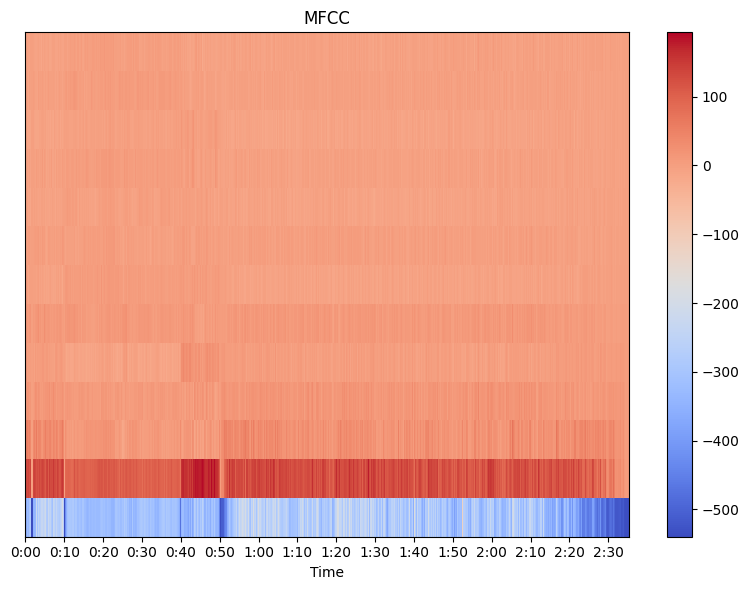

In [28]:
#load the audio file
y, sr = librosa.load("beeAudioFile.mp3")

#y will contain the audio signal as a NumPy array
#sr will be the sample rate of the audio file

# Compute MFCC coefficients
#mfccs = librosa.feature.mfcc(y=y, sr=sr)

# Compute MFCC coefficients
n_mfcc = 13  # Number of desired IMFCC coefficients
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, hop_length=512)

# Display MFCCs as an image
plt.figure(figsize=(8, 6))
librosa.display.specshow(mfccs, x_axis='time')
plt.colorbar()
plt.title('MFCC')

# Convert time frames to time in seconds
time_in_seconds = librosa.times_like(mfccs.shape[1], sr=sr)

# Set custom x-axis ticks
plt.xticks(np.arange(0, time_in_seconds[-1], 10))

plt.tight_layout()
plt.show()

In [6]:
mfccs

array([[-539.8208   , -539.8208   , -539.8208   , ..., -529.79596  ,
        -530.4319   , -533.6619   ],
       [   0.       ,    0.       ,    0.       , ...,   13.446726 ,
          12.674267 ,    8.314087 ],
       [   0.       ,    0.       ,    0.       , ...,   11.378753 ,
          10.948574 ,    7.175763 ],
       ...,
       [   0.       ,    0.       ,    0.       , ...,   -5.8849726,
          -6.0240746,   -4.624154 ],
       [   0.       ,    0.       ,    0.       , ...,   -5.2256107,
          -5.4211845,   -4.010719 ],
       [   0.       ,    0.       ,    0.       , ...,   -4.337161 ,
          -4.391673 ,   -2.9964278]], dtype=float32)

In [7]:
# Define the target sample rate (e.g., 16000 Hz for 16 kHz)
target_sr = 2000

# Resample the audio to the target sample rate
y_resampled = librosa.resample(y, orig_sr=sr, target_sr=target_sr)

# Save the resampled audio to a new file
output_file_path = 'file_resampled.wav'
sf.write(output_file_path, y_resampled, target_sr)

ipd.Audio(output_file_path)

svm vs LSTM


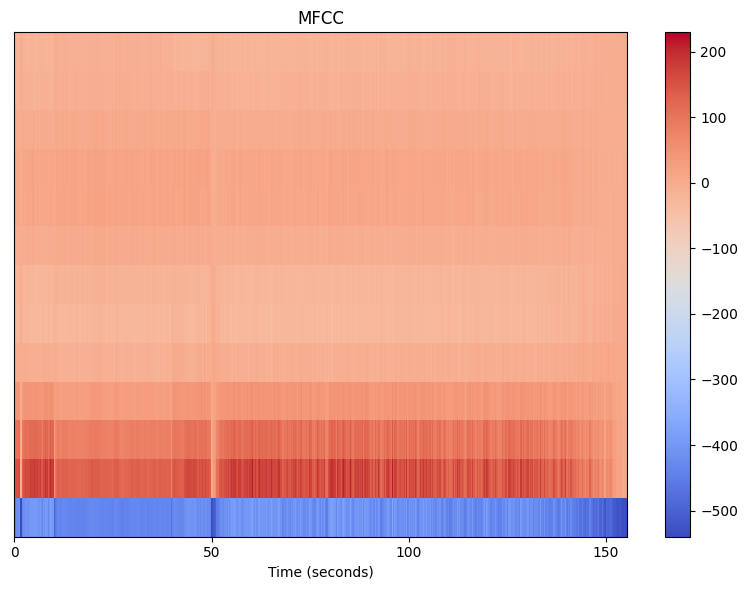

In [21]:


# Compute MFCC coefficients
n_mfcc = 13  # Number of desired IMFCC coefficients

y_new, sr_r = librosa.load("file_resampled.wav")

mfccs = librosa.feature.mfcc(y=y_new, sr=sr_r, n_mfcc=n_mfcc, hop_length=512)

# Display MFCCs as an image
plt.figure(figsize=(8, 6))
librosa.display.specshow(mfccs, x_axis='s' )
plt.colorbar()
plt.title('MFCC')
plt.tight_layout()
plt.show()

In [9]:
# print resampled file

sample_rate, audio = wavfile.read( "file_resampled.wav")
#sample_rate, audio = librosa.load("beeAudioFile.mp3")
print("Sample rate: {0}Hz".format(sample_rate))
print("Audio duration: {0}s".format(len(audio) / sample_rate))

Sample rate: 2000Hz
Audio duration: 155.3525s
